In [3]:
%pip install tf_keras_vis

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.5/52.5 kB 4.9 MB/s eta 0:00:00


# Create your dataset

1) Choose which classes you would like to add.

2) Create a dataset with your own photos

3) Separate your dataset into train and test subsets.

In [2]:
import os
import pandas as pd
from glob import glob

def create_dataframe_from_directories(path):
    data = []

    for label_dir in os.listdir(path):
        if os.path.isfile(label_dir):
            continue

        label_path_path = os.path.join(path, label_dir)
        for file in os.listdir(label_path_path):
            data.append([os.path.join(label_path_path, file), label_dir])

    return pd.DataFrame(data, columns = ["path", "label"])

In [4]:
# If you're using Google Colab, you need to upload your data to Google Drive.
# Then, run the following code to mount your Google Drive and access your files in Colab.

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
# ToDo: Provide the path to the training and testing dataset directories

train_df = create_dataframe_from_directories("/content/drive/My Drive/Colab Notebooks/ARN_05/images/train")
test_df = create_dataframe_from_directories("/content/drive/My Drive/Colab Notebooks/ARN_05/images/test")

In [6]:
LABEL_NAMES = pd.unique(train_df['label'])
LABEL_NAMES

array(['bengal', 'cheval', 'chien', 'Sacredebirmanie'], dtype=object)

**TODO**: Display some images of your dataset

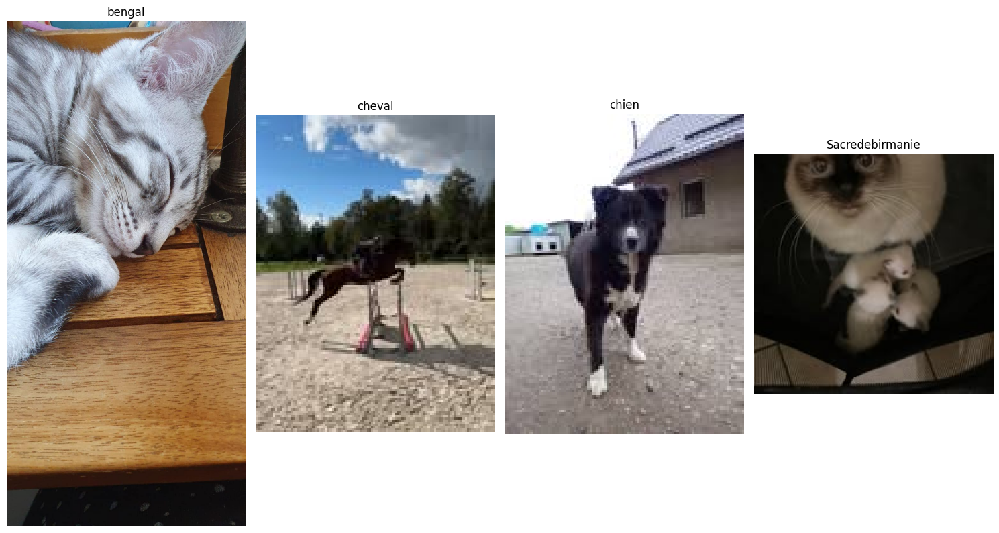

In [54]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Créer une figure
plt.figure(figsize=(15, 10))

# Afficher une image par classe
for i, label in enumerate(LABEL_NAMES):
    # Prendre le premier exemple de chaque classe
    sample = train_df[train_df['label'] == label].iloc[0]

    # Charger et afficher l'image
    plt.subplot(1, len(LABEL_NAMES), i+1)
    img = mpimg.imread(sample['path'])
    plt.imshow(img)
    plt.title(label)
    plt.axis('off')

plt.tight_layout()
plt.show()

# Explore your dataset

**TODO**: count the number of examples per classes and plot an histogram of it

Number of examples per class:
label
bengal             48
cheval             48
chien              48
Sacredebirmanie    48
Name: count, dtype: int64


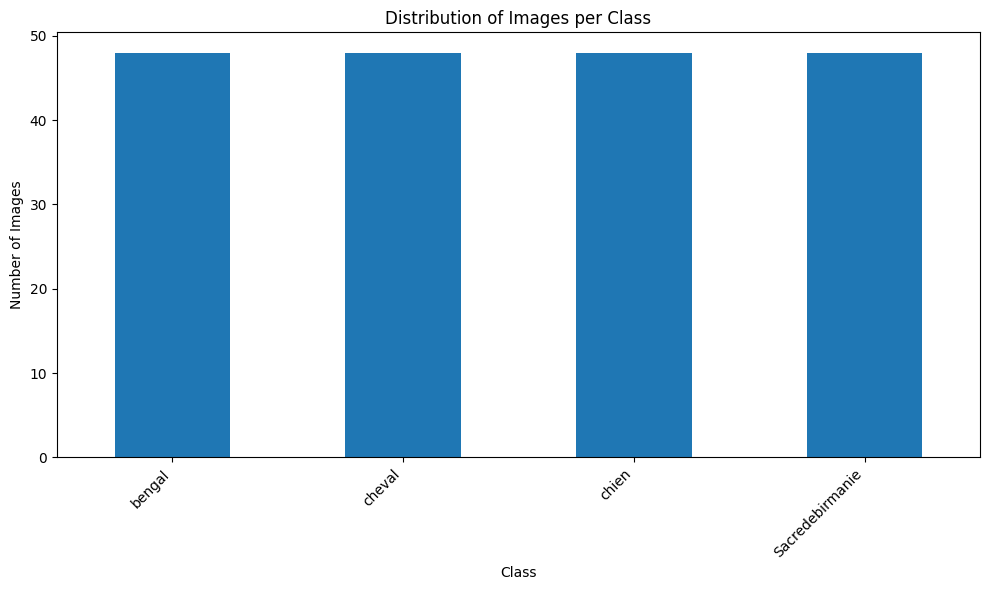

In [55]:
# Count the number of examples per class
class_counts = train_df['label'].value_counts()

# Display the counts
print("Number of examples per class:")
print(class_counts)

# Plot an histogram of the class counts
plt.figure(figsize=(10, 6))
class_counts.plot(kind='bar')
plt.title('Distribution of Images per Class')
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Preprocessing steps

In [56]:
from tensorflow.keras.layers import (
    Resizing, Rescaling,
    RandomFlip, RandomRotation, RandomZoom, RandomContrast
)

from tensorflow.keras import Sequential

IMG_HEIGHT = 224
IMG_WIDTH = 224

image_preprocesses = Sequential([
    Resizing(IMG_HEIGHT, IMG_WIDTH, crop_to_aspect_ratio=True),
    Rescaling(1. / 255)
])

image_augmentations = Sequential([
    # TODO: choose some image augmentations layers
    # see which keras layers you can use
    # The kind of layers you will want to use starts with "Random".
    # See the following page for more information on data augmentation :
    # https://www.tensorflow.org/tutorials/images/data_augmentation
    RandomFlip("horizontal_and_vertical"),
    RandomRotation(0.2),
    RandomZoom(0.2),
    RandomContrast(0.2),
])

def open_images(paths):
    return np.stack([
        open_image(path) for path in paths
    ])

def open_image(path):
    with PIL.Image.open(path) as image:
        opened_img = image_preprocesses(np.asarray(image))

    return opened_img

def augment_images(images):
    return np.stack([
        image_augmentations(img) for img in images
    ])

**TODO**: plot examples of preprocessed and augmented images

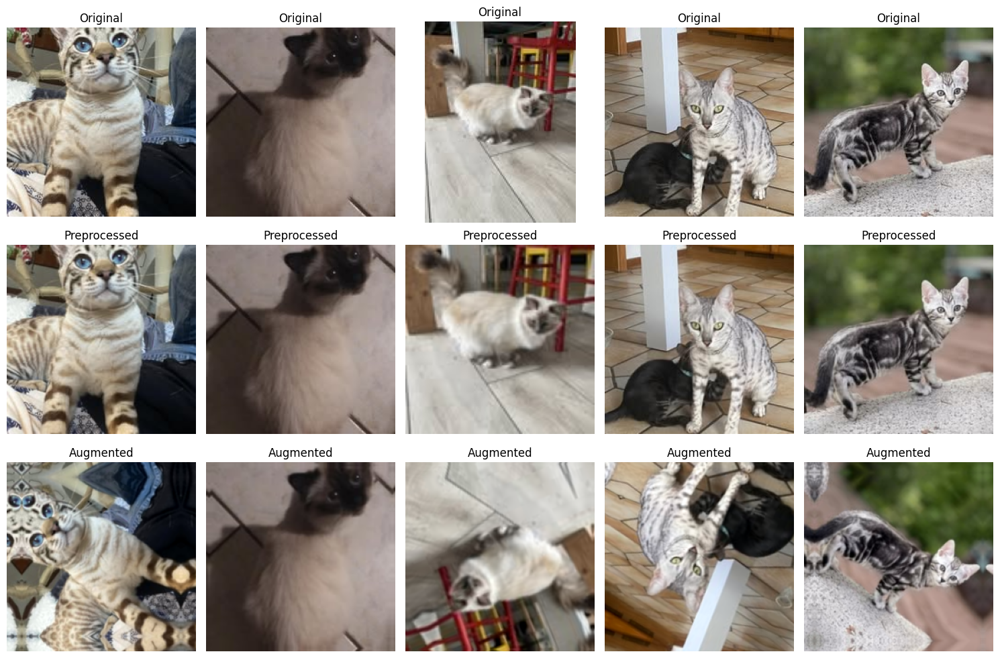

In [57]:
import matplotlib.pyplot as plt
import numpy as np
import PIL

num_images_to_display = 5

plt.figure(figsize=(15, 10))
for i in range(num_images_to_display):
    # Select a random image from the training data
    random_index = np.random.randint(0, len(train_df))
    image_path = train_df.iloc[random_index]['path']
    image_label = train_df.iloc[random_index]['label']

    # Open and preprocess the image
    original_img = PIL.Image.open(image_path)
    preprocessed_img = open_image(image_path)

    # Augment the preprocessed image
    augmented_img = augment_images(np.expand_dims(preprocessed_img, axis=0))[0] # augment_images expects a batch

    # Plot the original, preprocessed, and augmented images
    plt.subplot(3, num_images_to_display, i + 1)
    plt.imshow(original_img)
    plt.title('Original')
    plt.axis('off')

    plt.subplot(3, num_images_to_display, i + num_images_to_display + 1)
    plt.imshow(preprocessed_img)
    plt.title('Preprocessed')
    plt.axis('off')

    plt.subplot(3, num_images_to_display, i + 2 * num_images_to_display + 1)
    plt.imshow(augmented_img)
    plt.title('Augmented')
    plt.axis('off')

plt.tight_layout()
plt.show()

## Define model

In [58]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras import Model
from tensorflow.keras.layers import (
    GlobalAveragePooling2D,
    Dense,
    Dropout
)

def get_model():
    base_model = MobileNetV2(
        input_shape=(224, 224, 3),
        weights='imagenet',
        include_top=False
    )

    layers = base_model.output

    added_layers = [
        # important, we need global average pooling instead of flatten for class activation map later on
        GlobalAveragePooling2D(),
        # TODO: ...
        Dense(128, activation='relu'),
        Dropout(0.2),
        Dense(len(LABEL_NAMES), activation='softmax')
    ]

    model = Model(inputs=base_model.input, outputs=Sequential(added_layers)(layers))

    # TODO: freeze layers
    base_model.trainable = False
    model.compile(
      optimizer = RMSprop(),
      loss = SparseCategoricalCrossentropy(),
      metrics = ['acc']
    )

    return model

In [59]:
get_model().summary()

Model: "functional_104"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_38      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer_38[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 2,422,468 (9.24 MB)

 Trainable params: 164,484 (642.52 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

# Model training

**TODO**: cross-validate your model, you can base yourself on the code from the first part of this practical work

**NOTE**: you shouldn't augment validations images. What we want to evaluate is the performances on "real" images, not on images that are augmented and change all the time

In [60]:
from tensorflow.keras.layers import Resizing, Rescaling
from tensorflow.keras import Sequential

IMG_HEIGHT = 224
IMG_WIDTH = 224

image_preprocesses = Sequential([
    Resizing(IMG_HEIGHT, IMG_WIDTH, crop_to_aspect_ratio=True),
    Rescaling(1. / 255)
])

In [61]:
def open_images(paths):
    images = []
    for path in paths:
        with PIL.Image.open(path).convert('RGB') as image:
            images.append(image_preprocesses(np.asarray(image)))

    return np.stack(images)

In [62]:
import numpy as np
import tensorflow as tf
from sklearn.model_selection import KFold
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

shuffled_dataset = train_df.sample(frac=1, random_state=1234).reset_index(drop=True)

dataset_paths = shuffled_dataset['path'].to_numpy()
dataset_labels = shuffled_dataset['label'].to_numpy()

total_train_paths, test_paths, total_train_labels, test_labels = train_test_split(
    dataset_paths, dataset_labels, test_size=0.2, random_state=1234, stratify=dataset_labels
)

# We need to convert from string labels to integers
label_encoder = LabelEncoder()
label_encoder.fit(dataset_labels)
total_train_labels = label_encoder.transform(total_train_labels)
test_labels = label_encoder.transform(test_labels)

NB_EPOCHS = 6

train_losses = []
train_accuracies = []
val_losses = []
val_accuracies = []

for train_index, val_index in KFold(n_splits=5).split(total_train_paths, total_train_labels):
    train_images = open_images(total_train_paths[train_index])
    train_labels = total_train_labels[train_index]

    val_images = open_images(total_train_paths[val_index])
    val_labels = total_train_labels[val_index]

    model = get_model() # We reinitialize the model

    history = model.fit(
        x=train_images,
        y=train_labels,
        batch_size=16,
        validation_data=[val_images, val_labels],
        epochs=NB_EPOCHS,
    )


    train_losses.append(history.history['loss'])
    val_losses.append(history.history['val_loss'])
    train_accuracies.append(history.history['acc'])
    val_accuracies.append(history.history['val_acc'])

Correspondance des labels :
0 -> Sacredebirmanie
1 -> bengal
2 -> cheval
3 -> chien
Epoch 1/6
8/8 ━━━━━━━━━━━━━━━━━━━━ 18s 1s/step - acc: 0.4910 - loss: 1.3913 - val_acc: 0.9032 - val_loss: 0.2740
Epoch 2/6
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - acc: 0.9777 - loss: 0.1099 - val_acc: 1.0000 - val_loss: 0.1001
Epoch 3/6
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - acc: 1.0000 - loss: 0.0248 - val_acc: 0.9355 - val_loss: 0.1086
Epoch 4/6
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - acc: 1.0000 - loss: 0.0165 - val_acc: 1.0000 - val_loss: 0.0678
Epoch 5/6
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - acc: 1.0000 - loss: 0.0101 - val_acc: 0.9677 - val_loss: 0.0711
Epoch 6/6
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - acc: 1.0000 - loss: 0.0055 - val_acc: 1.0000 - val_loss: 0.0552
Epoch 1/6
8/8 ━━━━━━━━━━━━━━━━━━━━ 18s 1s/step - acc: 0.5770 - loss: 1.1067 - val_acc: 0.9355 - val_loss: 0.1723
Epoch 2/6
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - acc: 0.9755 - loss: 0.1034 - val_acc: 0.9355 - val_loss: 0.1787
Epoch 

In [63]:
def plot_kfold_mean_performance(ax, train_performances, val_performances, measure_name):
    train_mean = np.mean(train_performances, axis=0)
    val_mean = np.mean(val_performances, axis=0)
    train_sd = np.std(train_performances, axis=0)
    val_sd = np.std(val_performances, axis=0)

    ax.fill_between(np.arange(NB_EPOCHS), train_mean, train_mean+train_sd, facecolor='blue', alpha=0.5, label='Train')
    ax.fill_between(np.arange(NB_EPOCHS), train_mean, train_mean-train_sd, facecolor='blue', alpha=0.5)

    ax.fill_between(np.arange(NB_EPOCHS), val_mean, val_mean+val_sd, facecolor='orange', alpha=0.5, label='Val')
    ax.fill_between(np.arange(NB_EPOCHS), val_mean, val_mean-val_sd, facecolor='orange', alpha=0.5)

    ax.set_xticks(np.arange(NB_EPOCHS))

    ax.set_ylabel(measure_name)
    ax.set_xlabel('Number of epochs')
    #pl.title(str(K)+'-fold CV with '+str(n)+' hidden neurons')
    ax.legend()
    ax.grid()

# Results

**TODO**: plot the results from your crossvalidation

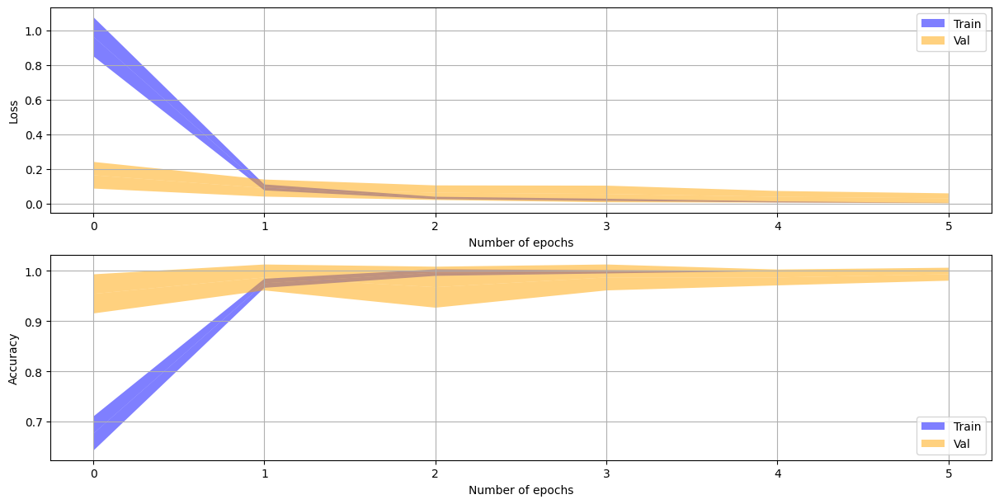

In [64]:
import matplotlib.pyplot as pl

fig, axs = plt.subplots(2, 1, constrained_layout=True, figsize=(12,6))

plot_kfold_mean_performance(axs[0], train_losses, val_losses, "Loss")
plot_kfold_mean_performance(axs[1], train_accuracies, val_accuracies, "Accuracy")

## Evaluate model on test set

**TODO**: when you've selected a final model, evaluate its performances (f-score, confusion matrix, ...) on your test set

In [71]:
train_images = open_images(total_train_paths)
train_labels = total_train_labels

model = get_model()

history = model.fit(
    x=train_images,
    y=train_labels,
    batch_size=16,
    epochs=NB_EPOCHS,
)

Epoch 1/6
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 272ms/step - acc: 0.5402 - loss: 1.4258
Epoch 2/6
10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - acc: 0.9782 - loss: 0.0908
Epoch 3/6
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - acc: 0.9932 - loss: 0.0439
Epoch 4/6
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - acc: 1.0000 - loss: 0.0221
Epoch 5/6
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - acc: 1.0000 - loss: 0.0064
Epoch 6/6
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - acc: 1.0000 - loss: 0.0073


2/2 ━━━━━━━━━━━━━━━━━━━━ 6s 3s/step
F1_score:  0.9742947111368164


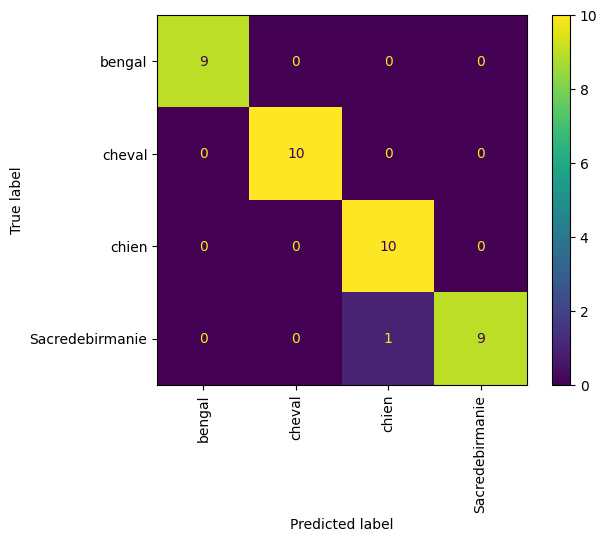

In [72]:
import sklearn.metrics as me

train_images = open_images(total_train_paths)
train_labels = total_train_labels

test_images = open_images(test_paths)

pred = model.predict(test_images)
pred = np.argmax(pred, axis=-1)

test_confusion_matrix = me.confusion_matrix(test_labels, pred, labels=np.arange(len(LABEL_NAMES)))
f1_score = me.f1_score(test_labels, pred, average='weighted')
print("F1_score: ", f1_score)
confusion_matrix_display = me.ConfusionMatrixDisplay(
    confusion_matrix=test_confusion_matrix,
    display_labels=LABEL_NAMES,
)

confusion_matrix_display.plot(xticks_rotation='vertical')
plt.show()

In [77]:
from sklearn.metrics import classification_report

test_images = open_images(test_paths)
predictions = model.predict(test_images)
predicted_labels = np.argmax(predictions, axis=1)

class_names = label_encoder.classes_

report = classification_report(test_labels, predicted_labels,
                              target_names=class_names, digits=4)
print("Rapport de classification par classe:\n", report)

from sklearn.metrics import f1_score

f1_scores = f1_score(test_labels, predicted_labels, average=None)  # average=None pour avoir par classe

for class_name, score in zip(class_names, f1_scores):
    print(f"F1-score pour la classe {class_name}: {score:.4f}")

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Rapport de classification par classe:
                  precision    recall  f1-score   support

Sacredebirmanie     1.0000    1.0000    1.0000         9
         bengal     1.0000    1.0000    1.0000        10
         cheval     0.9091    1.0000    0.9524        10
          chien     1.0000    0.9000    0.9474        10

       accuracy                         0.9744        39
      macro avg     0.9773    0.9750    0.9749        39
   weighted avg     0.9767    0.9744    0.9743        39

F1-score pour la classe Sacredebirmanie: 1.0000
F1-score pour la classe bengal: 1.0000
F1-score pour la classe cheval: 0.9524
F1-score pour la classe chien: 0.9474


### Display some misclassified images

**TODO**: display some misclassified images to be able to see what images are difficult for the model

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Nombre d'images mal classées : 1/39


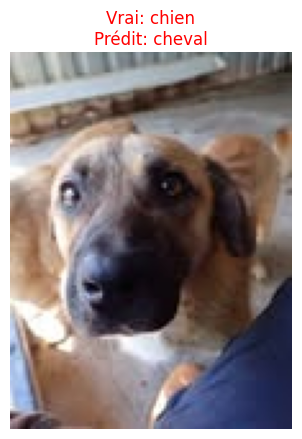

In [73]:
# Afficher quelques images mal classées
import matplotlib.pyplot as plt
import numpy as np
import PIL.Image

# Nombre d'images à afficher
num_images_to_display = 5

# Prédictions sur le jeu de test
test_images = open_images(test_paths)
predictions = model.predict(test_images)
predicted_labels = np.argmax(predictions, axis=1)

# Indices des images mal classées
misclassified_indices = np.where(test_labels != predicted_labels)[0]

if len(misclassified_indices) == 0:
    print("Félicitations ! Aucune image mal classée dans le jeu de test.")
else:
    print(f"Nombre d'images mal classées : {len(misclassified_indices)}/{len(test_labels)}")

    # Conversion des labels encodés en noms de classes
    true_class_names = label_encoder.inverse_transform(test_labels[misclassified_indices])
    predicted_class_names = label_encoder.inverse_transform(predicted_labels[misclassified_indices])

    # Sélection aléatoire d'images à afficher
    display_indices = np.random.choice(misclassified_indices,
                                     min(num_images_to_display, len(misclassified_indices)),
                                     replace=False)

    # Affichage
    plt.figure(figsize=(15, 8))
    for i, idx in enumerate(display_indices):
        # Chargement de l'image originale
        img = PIL.Image.open(test_paths[idx])

        # Récupération des noms de classes
        true_label = true_class_names[np.where(misclassified_indices == idx)[0][0]]
        predicted_label = predicted_class_names[np.where(misclassified_indices == idx)[0][0]]

        # Affichage
        plt.subplot(1, num_images_to_display, i+1)
        plt.imshow(img)
        plt.title(f"Vrai: {true_label}\nPrédit: {predicted_label}", color='red')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

## Use grad-cam to inspect how the model classify
Here we can see an heatmap of the regions that activates the model the most.

### For more information:
- tf-keras-vis documentation: https://keisen.github.io/tf-keras-vis-docs/
- Grad-cam paper: https://arxiv.org/pdf/1610.02391.pdf
- Grad-cam++ paper: https://arxiv.org/pdf/1710.11063.pdf

**NOTE**: maybe you will need to adapt some variable names based on your code above. For example, _model_ should be the model trained on all the training data.

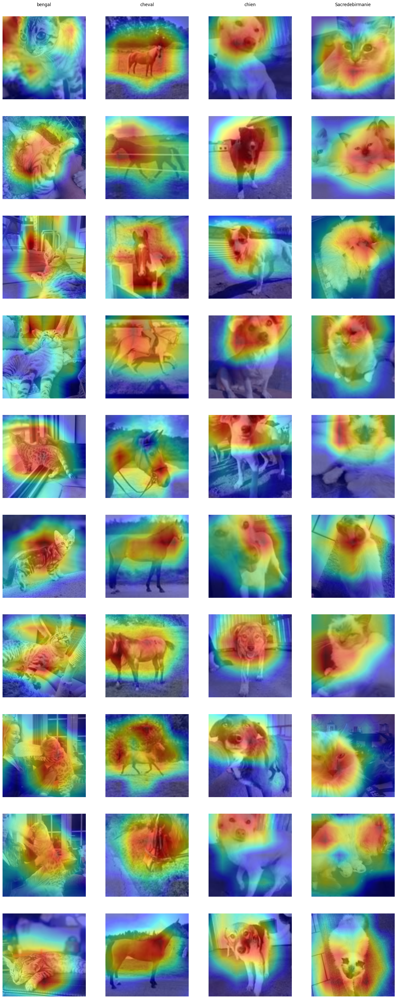

In [74]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import cm
from tensorflow.keras.applications import MobileNetV2
from tf_keras_vis.gradcam_plus_plus import GradcamPlusPlus
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore

# Create GradCAM++ object
gradcam = GradcamPlusPlus(
    model,
    model_modifier=ReplaceToLinear(),
    clone=True,
)

nb_images_per_class = 10

fig, axs = plt.subplots(nb_images_per_class, len(LABEL_NAMES), figsize=(len(LABEL_NAMES) * 5, nb_images_per_class * 5))

for label_idx, label_name in enumerate(LABEL_NAMES):
    axs[0,label_idx].set_title(label_name, loc='center', y=1.1)

    i = 0
    for _, rowdata in train_df[train_df['label'] == label_name].sample(frac=1).head(nb_images_per_class).iterrows():
        img = open_image(rowdata.path)
        pred = model(np.expand_dims(img, axis=0))

        # Generate cam with GradCAM++
        score = CategoricalScore(np.argmax(pred))
        cam = gradcam(score, img)
        heatmap = np.uint8(cm.jet(cam[0])[..., :3] * 255)

        axs[i,label_idx].imshow(img, vmin=0, vmax=1)
        axs[i,label_idx].imshow(heatmap, cmap='jet', alpha=0.5) # overlay
        axs[i,label_idx].axis("off")

        i += 1

### Grad-cam on misclassified images

**TODO**: now do the same than above, but with the misclassified images. You shouldn't change anything pertaining to grad-cam besides on which image and prediction you do it

**TODO**: try to determine what caused the misclassifcations and what you can do about it

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


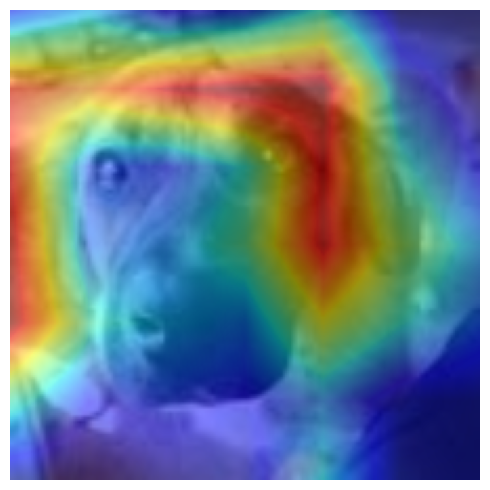

In [79]:
# Create GradCAM++ object
gradcam = GradcamPlusPlus(
    model,
    model_modifier=ReplaceToLinear(),
    clone=True,
)

nb_images_to_display = 10

# Calculate predictions for the test set
pred = model.predict(test_images)
pred = np.argmax(pred, axis=-1)


# Identify misclassified images
misclassified_indices = np.where(test_labels != pred)[0]
misclassified_paths = test_paths[misclassified_indices]
misclassified_true_labels = test_labels[misclassified_indices]
misclassified_predicted_labels = pred[misclassified_indices]

# Limit the number of misclassified images to display
if len(misclassified_indices) > nb_images_to_display:
    display_indices = np.random.choice(misclassified_indices, nb_images_to_display, replace=False)
    misclassified_paths = test_paths[display_indices]
    misclassified_true_labels = test_labels[display_indices]
    misclassified_predicted_labels = pred[display_indices]
else:
    display_indices = misclassified_indices


fig, axs = plt.subplots(len(misclassified_paths), 1, figsize=(5, len(misclassified_paths) * 5))

if len(misclassified_paths) > 0:
    if len(misclassified_paths) == 1:
        axs = [axs]

    for i, (img_path, true_label_idx, predicted_label_idx) in enumerate(zip(misclassified_paths, misclassified_true_labels, misclassified_predicted_labels)):
        img = open_image(img_path)
        # We need the prediction for the single image for the CategoricalScore
        single_image_pred = model(np.expand_dims(img, axis=0))


        # Generate cam with GradCAM++
        score = CategoricalScore(predicted_label_idx) # Use the predicted label for the score
        cam = gradcam(score, img)
        heatmap = np.uint8(cm.jet(cam[0])[..., :3] * 255)

        axs[i].imshow(img, vmin=0, vmax=1)
        axs[i].imshow(heatmap, cmap='jet', alpha=0.5) # overlay
        axs[i].axis("off")

plt.tight_layout()
plt.show()